# Import Library

In [ ]:
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn import preprocessing

# Load dataset

In [ ]:
df = pd.read_csv("/credit_score.csv")
df.head()

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,0x1602,CUS_0xd40,January,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,_,809.98,26.822620,22 Years and 1 Months,No,49.574949,80.41529543900253,High_spent_Small_value_payments,312.49408867943663,Good
1,0x1603,CUS_0xd40,February,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,31.944960,NaN,No,49.574949,118.28022162236736,Low_spent_Large_value_payments,284.62916249607184,Good
2,0x1604,CUS_0xd40,March,Aaron Maashoh,-500,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,28.609352,22 Years and 3 Months,No,49.574949,81.699521264648,Low_spent_Medium_value_payments,331.2098628537912,Good
3,0x1605,CUS_0xd40,April,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,31.377862,22 Years and 4 Months,No,49.574949,199.4580743910713,Low_spent_Small_value_payments,223.45130972736786,Good
4,0x1606,CUS_0xd40,May,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,Good,809.98,24.797347,22 Years and 5 Months,No,49.574949,41.420153086217326,High_spent_Medium_value_payments,341.48923103222177,Good


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 28 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   ID                        100000 non-null  object 
 1   Customer_ID               100000 non-null  object 
 2   Month                     100000 non-null  object 
 3   Name                      90015 non-null   object 
 4   Age                       100000 non-null  object 
 5   SSN                       100000 non-null  object 
 6   Occupation                100000 non-null  object 
 7   Annual_Income             100000 non-null  object 
 8   Monthly_Inhand_Salary     84998 non-null   float64
 9   Num_Bank_Accounts         100000 non-null  int64  
 10  Num_Credit_Card           100000 non-null  int64  
 11  Interest_Rate             100000 non-null  int64  
 12  Num_of_Loan               100000 non-null  object 
 13  Type_of_Loan              88592 non-null   ob

In [ ]:
df.isna().sum()

ID                              0
Customer_ID                     0
Month                           0
Name                         9985
Age                             0
SSN                             0
Occupation                      0
Annual_Income                   0
Monthly_Inhand_Salary       15002
Num_Bank_Accounts               0
Num_Credit_Card                 0
Interest_Rate                   0
Num_of_Loan                     0
Type_of_Loan                11408
Delay_from_due_date             0
Num_of_Delayed_Payment       7002
Changed_Credit_Limit            0
Num_Credit_Inquiries         1965
Credit_Mix                      0
Outstanding_Debt                0
Credit_Utilization_Ratio        0
Credit_History_Age           9030
Payment_of_Min_Amount           0
Total_EMI_per_month             0
Amount_invested_monthly      4479
Payment_Behaviour               0
Monthly_Balance              1200
Credit_Score                    0
dtype: int64

In [ ]:
cols = df.columns

for i in range(len(cols)):
  print(f"Value of {cols[i]} column")
  print(df[cols[i]].unique())

Value of ID column
['0x1602' '0x1603' '0x1604' ... '0x25feb' '0x25fec' '0x25fed']
Value of Customer_ID column
['CUS_0xd40' 'CUS_0x21b1' 'CUS_0x2dbc' ... 'CUS_0xaf61' 'CUS_0x8600'
 'CUS_0x942c']
Value of Month column
['January' 'February' 'March' 'April' 'May' 'June' 'July' 'August']
Value of Name column
['Aaron Maashoh' nan 'Rick Rothackerj' ... 'Chris Wickhamm'
 'Sarah McBridec' 'Nicks']
Value of Age column
['23' '-500' '28_' ... '4808_' '2263' '1342']
Value of SSN column
['821-00-0265' '#F%$D@*&8' '004-07-5839' ... '133-16-7738' '031-35-0942'
 '078-73-5990']
Value of Occupation column
['Scientist' '_______' 'Teacher' 'Engineer' 'Entrepreneur' 'Developer'
 'Lawyer' 'Media_Manager' 'Doctor' 'Journalist' 'Manager' 'Accountant'
 'Musician' 'Mechanic' 'Writer' 'Architect']
Value of Annual_Income column
['19114.12' '34847.84' '34847.84_' ... '20002.88' '39628.99' '39628.99_']
Value of Monthly_Inhand_Salary column
[1824.84333333           nan 3037.98666667 ... 3097.00833333 1929.90666667
 3

# Data Preparation

In [ ]:
df = df.drop(['ID', 'Customer_ID', 'Name', 'SSN', 'Type_of_Loan'], axis=1)

In [ ]:
df['Month'] = pd.to_datetime(df.Month , format='%B').dt.month.astype(float)

In [ ]:
num_col = [
    'Age', 'Annual_Income', 'Monthly_Inhand_Salary', 'Num_Bank_Accounts',
    'Num_Credit_Card', 'Interest_Rate', 'Num_of_Loan', 'Delay_from_due_date',
    'Num_of_Delayed_Payment', 'Changed_Credit_Limit', 'Num_Credit_Inquiries',
    'Outstanding_Debt', 'Credit_Utilization_Ratio', 'Total_EMI_per_month',
    'Amount_invested_monthly', 'Monthly_Balance'
    ]

In [ ]:
categoricals = ['Occupation', 'Credit_Mix', 'Payment_of_Min_Amount', 'Payment_Behaviour', 'Credit_Score']

In [ ]:
for col in categoricals:
  print(f"Value counts of {col} column")
  print(df[col].value_counts(), '\n')

Value counts of Occupation column
_______          7062
Lawyer           6575
Architect        6355
Engineer         6350
Scientist        6299
Mechanic         6291
Accountant       6271
Developer        6235
Media_Manager    6232
Teacher          6215
Entrepreneur     6174
Doctor           6087
Journalist       6085
Manager          5973
Musician         5911
Writer           5885
Name: Occupation, dtype: int64 

Value counts of Credit_Mix column
Standard    36479
Good        24337
_           20195
Bad         18989
Name: Credit_Mix, dtype: int64 

Value counts of Payment_of_Min_Amount column
Yes    52326
No     35667
NM     12007
Name: Payment_of_Min_Amount, dtype: int64 

Value counts of Payment_Behaviour column
Low_spent_Small_value_payments      25513
High_spent_Medium_value_payments    17540
Low_spent_Medium_value_payments     13861
High_spent_Large_value_payments     13721
High_spent_Small_value_payments     11340
Low_spent_Large_value_payments      10425
!@9#%8               

## handle numeric feature

In [ ]:
for col in num_col:
  df[col] = pd.to_numeric(df[col], errors='coerce')

df.isna().sum()

Month                           0
Age                          4939
Occupation                      0
Annual_Income                6980
Monthly_Inhand_Salary       15002
Num_Bank_Accounts               0
Num_Credit_Card                 0
Interest_Rate                   0
Num_of_Loan                  4785
Delay_from_due_date             0
Num_of_Delayed_Payment       9746
Changed_Credit_Limit         2091
Num_Credit_Inquiries         1965
Credit_Mix                      0
Outstanding_Debt             1009
Credit_Utilization_Ratio        0
Credit_History_Age           9030
Payment_of_Min_Amount           0
Total_EMI_per_month             0
Amount_invested_monthly      8784
Payment_Behaviour               0
Monthly_Balance              1209
Credit_Score                    0
dtype: int64

## handle age feature

In [ ]:
# https://www.americamortgages.com/is-there-an-age-limit-for-getting-a-u-s-mortgage/

df = df[(df['Age'] > 18) & (df['Age'] < 75)]

## handle string

In [ ]:
df.replace('_______', np.NaN, inplace=True)

df.replace('!@9#%8', np.NaN, inplace=True)

df.replace('', np.NaN, inplace=True)

df.isna().sum()

Month                           0
Age                             0
Occupation                   6005
Annual_Income                5958
Monthly_Inhand_Salary       12698
Num_Bank_Accounts               0
Num_Credit_Card                 0
Interest_Rate                   0
Num_of_Loan                  4053
Delay_from_due_date             0
Num_of_Delayed_Payment       8290
Changed_Credit_Limit         1771
Num_Credit_Inquiries         1670
Credit_Mix                      0
Outstanding_Debt              864
Credit_Utilization_Ratio        0
Credit_History_Age           7668
Payment_of_Min_Amount           0
Total_EMI_per_month             0
Amount_invested_monthly      7470
Payment_Behaviour            6398
Monthly_Balance              1012
Credit_Score                    0
dtype: int64

## handle payment behaviour feature

In [ ]:
def get_spend_behaviour(x):
  if(isinstance(x, str)):
    split_data = x.split("_")
    return split_data[0]

def get_value_payment_behaviour(x):
  if(isinstance(x, str)):
    split_data = x.split("_")
    return split_data[2]

df['spend behaviour'] = df['Payment_Behaviour'].map(get_spend_behaviour)
df['value payment behaviour'] = df['Payment_Behaviour'].map(get_value_payment_behaviour)
df.drop(columns=['Payment_Behaviour'], inplace=True)

df.head()

,Month,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,...,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance,Credit_Score,spend behaviour,value payment behaviour
0,1.0,23.0,Scientist,19114.12,1824.843333,3,4,3,4.0,3,...,809.98,26.822620,22 Years and 1 Months,No,49.574949,80.415295,312.494089,Good,High,Small
1,2.0,23.0,Scientist,19114.12,NaN,3,4,3,4.0,-1,...,809.98,31.944960,NaN,No,49.574949,118.280222,284.629162,Good,Low,Large
3,4.0,23.0,Scientist,19114.12,NaN,3,4,3,4.0,5,...,809.98,31.377862,22 Years and 4 Months,No,49.574949,199.458074,223.451310,Good,Low,Small
4,5.0,23.0,Scientist,19114.12,1824.843333,3,4,3,4.0,6,...,809.98,24.797347,22 Years and 5 Months,No,49.574949,41.420153,341.489231,Good,High,Medium
5,6.0,23.0,Scientist,19114.12,NaN,3,4,3,4.0,8,...,809.98,27.262259,22 Years and 6 Months,No,49.574949,62.430172,340.479212,Good,None,None


## handle credit history age feature

In [ ]:
def get_num_months(x):
  if(isinstance(x, str)):
    split_data = x.split(" ")
    return str(float(split_data[0]) * 12 + float(split_data[3]))

df['Credit_History_Age'] = df['Credit_History_Age'].map(get_num_months)
df['Credit_History_Age'] = pd.to_numeric(df['Credit_History_Age'], errors='coerce')

df.head()

,Month,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,...,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance,Credit_Score,spend behaviour,value payment behaviour
0,1.0,23.0,Scientist,19114.12,1824.843333,3,4,3,4.0,3,...,809.98,26.822620,265.0,No,49.574949,80.415295,312.494089,Good,High,Small
1,2.0,23.0,Scientist,19114.12,NaN,3,4,3,4.0,-1,...,809.98,31.944960,NaN,No,49.574949,118.280222,284.629162,Good,Low,Large
3,4.0,23.0,Scientist,19114.12,NaN,3,4,3,4.0,5,...,809.98,31.377862,268.0,No,49.574949,199.458074,223.451310,Good,Low,Small
4,5.0,23.0,Scientist,19114.12,1824.843333,3,4,3,4.0,6,...,809.98,24.797347,269.0,No,49.574949,41.420153,341.489231,Good,High,Medium
5,6.0,23.0,Scientist,19114.12,NaN,3,4,3,4.0,8,...,809.98,27.262259,270.0,No,49.574949,62.430172,340.479212,Good,None,None


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 84662 entries, 0 to 99999
Data columns (total 24 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Month                     84662 non-null  float64
 1   Age                       84662 non-null  float64
 2   Occupation                78657 non-null  object 
 3   Annual_Income             78704 non-null  float64
 4   Monthly_Inhand_Salary     71964 non-null  float64
 5   Num_Bank_Accounts         84662 non-null  int64  
 6   Num_Credit_Card           84662 non-null  int64  
 7   Interest_Rate             84662 non-null  int64  
 8   Num_of_Loan               80609 non-null  float64
 9   Delay_from_due_date       84662 non-null  int64  
 10  Num_of_Delayed_Payment    76372 non-null  float64
 11  Changed_Credit_Limit      82891 non-null  float64
 12  Num_Credit_Inquiries      82992 non-null  float64
 13  Credit_Mix                84662 non-null  object 
 14  Outsta

## handle duplicate value

In [ ]:
has_duplicates = df.duplicated().any()
print("Data has duplicate lines:", has_duplicates)

Data has duplicate lines: False


## handle missing value

In [ ]:
df = df.dropna()

df.isna().sum()

Month                       0
Age                         0
Occupation                  0
Annual_Income               0
Monthly_Inhand_Salary       0
Num_Bank_Accounts           0
Num_Credit_Card             0
Interest_Rate               0
Num_of_Loan                 0
Delay_from_due_date         0
Num_of_Delayed_Payment      0
Changed_Credit_Limit        0
Num_Credit_Inquiries        0
Credit_Mix                  0
Outstanding_Debt            0
Credit_Utilization_Ratio    0
Credit_History_Age          0
Payment_of_Min_Amount       0
Total_EMI_per_month         0
Amount_invested_monthly     0
Monthly_Balance             0
Credit_Score                0
spend behaviour             0
value payment behaviour     0
dtype: int64

# Exploratory Data Analysis

In [ ]:
import seaborn as sns
import plotly.figure_factory as ff
import plotly.express as px
import matplotlib.pyplot as plt
from matplotlib import colors
import matplotlib.ticker as mtick
import plotly.graph_objects as go
import random
import math

## Overall

In [ ]:
df.head()

,Month,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,...,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance,Credit_Score,spend behaviour,value payment behaviour
0,1.0,23.0,Scientist,19114.12,1824.843333,3,4,3,4.0,3,...,809.98,26.822620,265.0,No,49.574949,80.415295,312.494089,Good,High,Small
9,2.0,28.0,Teacher,34847.84,3037.986667,2,4,6,1.0,7,...,605.03,38.550848,320.0,No,18.816215,40.391238,484.591214,Good,High,Large
12,5.0,28.0,Teacher,34847.84,3037.986667,2,4,6,1.0,3,...,605.03,34.977895,323.0,No,18.816215,130.115420,444.867032,Good,Low,Small
13,6.0,28.0,Teacher,34847.84,3037.986667,2,4,6,1.0,3,...,605.03,33.381010,324.0,No,18.816215,43.477190,481.505262,Good,High,Large
15,8.0,28.0,Teacher,34847.84,3037.986667,2,4,6,1.0,3,...,605.03,32.933856,326.0,No,18.816215,218.904344,356.078109,Good,Low,Small


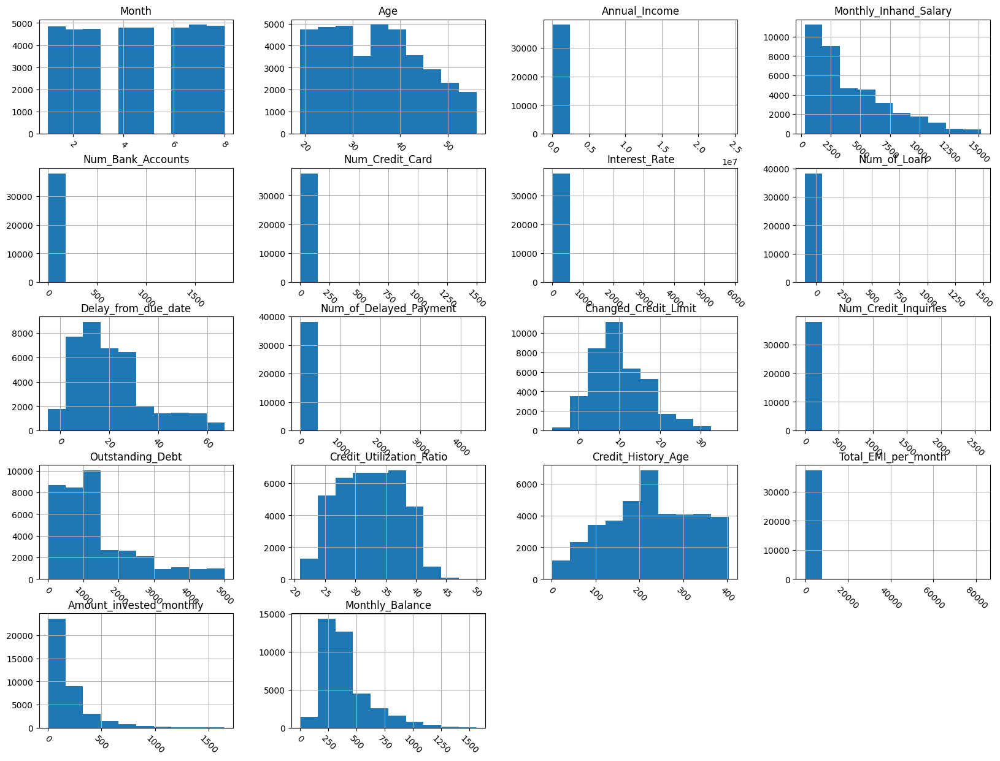

In [ ]:
df.hist(figsize=(20,15), xrot=-45)
plt.show()

## Target distribution

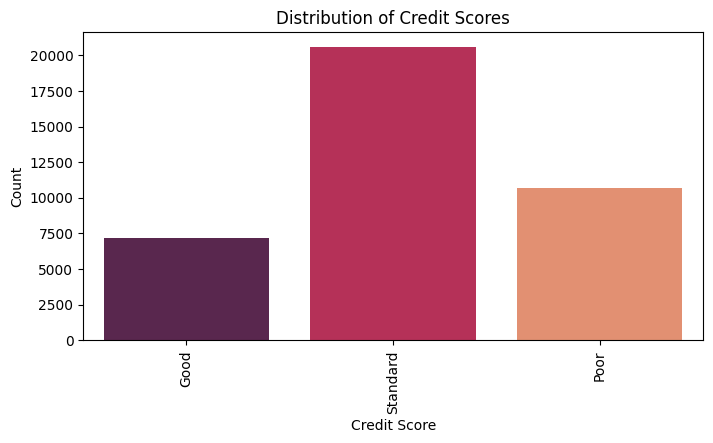

In [ ]:
plt.figure(figsize=(8, 4))
sns.countplot(data=df, x='Credit_Score', palette='rocket')
plt.xlabel('Credit Score')
plt.ylabel('Count')
plt.title('Distribution of Credit Scores')
plt.xticks(rotation=90)
plt.show()

In [ ]:
credit_score_counts = df['Credit_Score'].value_counts()

print(credit_score_counts)

Standard    20594
Poor        10696
Good         7150
Name: Credit_Score, dtype: int64


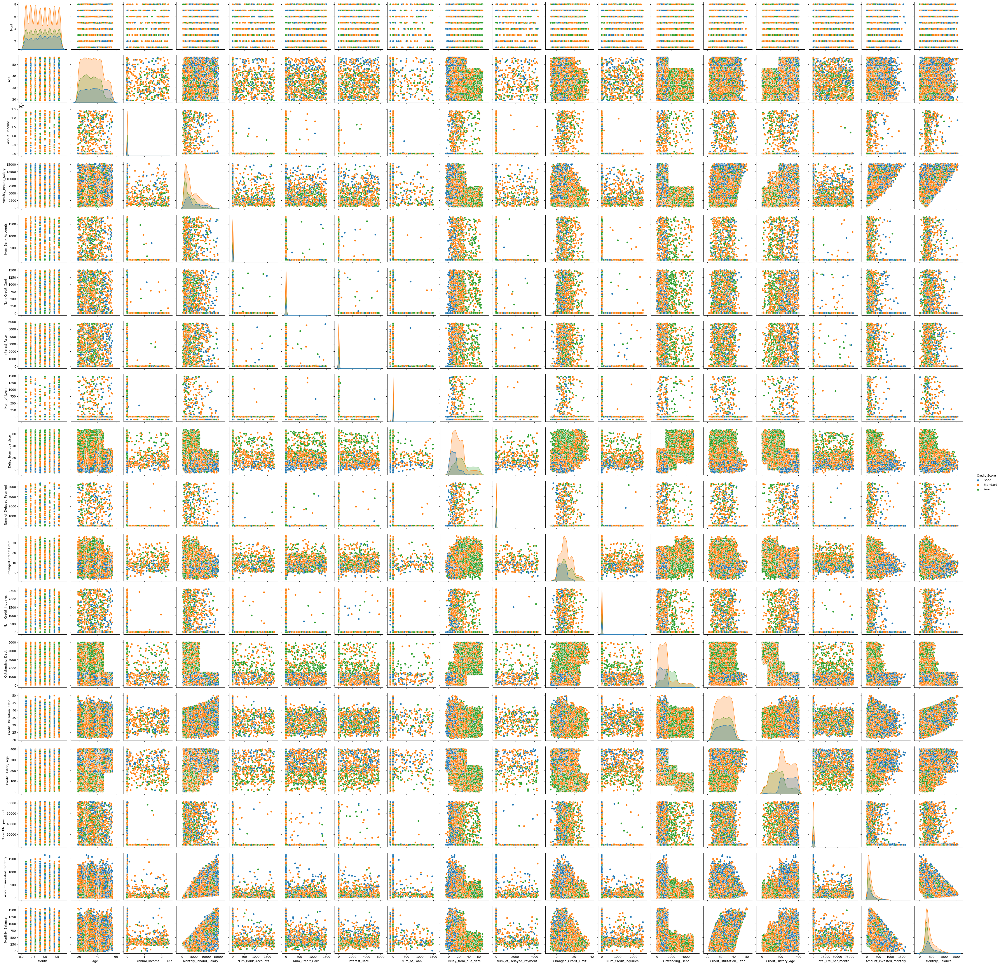

In [ ]:
sns.pairplot(df, hue='Credit_Score')

## Age

In [ ]:
df['Age'].describe()

count    38440.000000
mean        34.866701
std          9.888729
min         19.000000
25%         27.000000
50%         34.000000
75%         42.000000
max         56.000000
Name: Age, dtype: float64

<Axes: xlabel='Age', ylabel='count'>

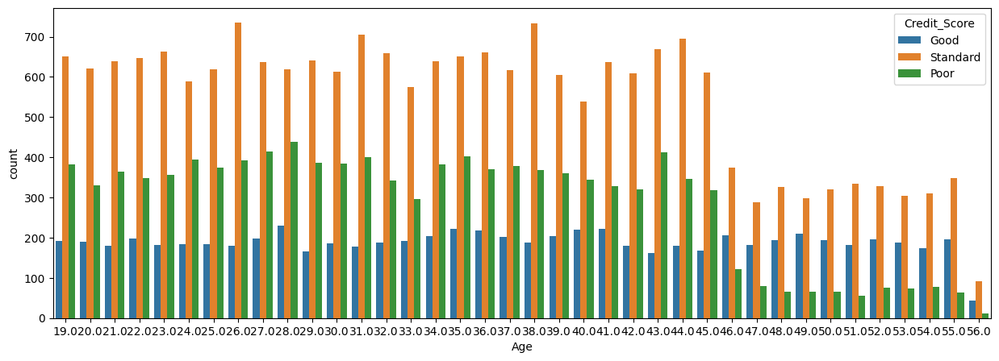

In [ ]:
plt.figure(figsize=(15,5))
sns.countplot(data=df, x='Age', hue='Credit_Score')

<Axes: xlabel='Age', ylabel='Density'>

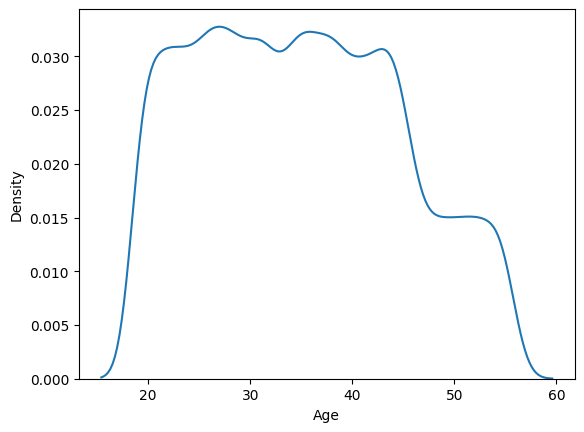

In [ ]:
sns.kdeplot(df['Age'])

## Occupation

<Axes: xlabel='Occupation', ylabel='count'>

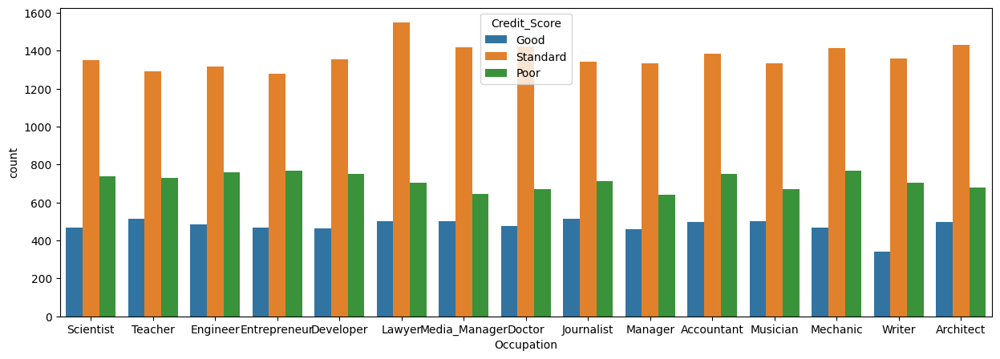

In [ ]:
plt.figure(figsize=(15,5))
sns.countplot(data=df, x='Occupation', hue='Credit_Score')

In [ ]:
col_df =df.groupby('Occupation')['Outstanding_Debt'].mean().reset_index().sort_values(by='Outstanding_Debt', ascending=False)

fig = px.bar(col_df, x='Occupation', y='Outstanding_Debt', title='Mean Outstanding Debt by Occupation')
fig.update_layout(xaxis_title='Occupation', yaxis_title='Mean Outstanding Debt')
fig.show()

In [ ]:
col_df =df.groupby('Occupation')['Monthly_Inhand_Salary'].mean().reset_index().sort_values(by='Monthly_Inhand_Salary', ascending=False)

fig = px.bar(col_df, x='Occupation', y='Monthly_Inhand_Salary', title='Mean Monthly Inhand Salary by Occupation')
fig.update_layout(xaxis_title='Occupation', yaxis_title='Mean Monthly Inhand Salary')
fig.show()

In [ ]:
occupation_loan_counts = df.groupby('Occupation')['Num_of_Loan'].sum().reset_index()

occupation_loan_counts = occupation_loan_counts.sort_values(by='Num_of_Loan', ascending=False)

fig = px.bar(occupation_loan_counts, x='Occupation', y='Num_of_Loan', title='Number of Loans by Occupation Group')
fig.update_layout(xaxis_title='Occupation', yaxis_title='Total Number of Loans')
fig.show()

In [ ]:
credit_good = df[df.Credit_Score == 'Good']
credit_std = df[df.Credit_Score == 'Standard']
credit_poor = df[df.Credit_Score == 'Poor']

credit = {'Good' : credit_good.Annual_Income.mean(),
          'Standard' : credit_std.Annual_Income.mean(),
          'Poor' : credit_poor.Annual_Income.mean()
          }

count = {'Good' : credit_good.Annual_Income.count(),
         'Standard' : credit_std.Annual_Income.count(),
         'Poor' : credit_poor.Annual_Income.count()
         }


fig = px.bar(x=list(count.keys()), y=list(count.values()),
             labels={'x': 'Credit Score', 'y': 'Annual Income'},
             title='Variation in Annual Income with Change in Credit Score'
             )
fig.update_traces(marker_color='blue', width=0.4)


fig.add_trace(px.scatter(x=list(credit.keys()),
                         y=list(credit.values()),
                         color_discrete_sequence=['white'],
                         labels={'x': 'Credit Score', 'y': 'User'},
                         ).data[0])

fig.update_xaxes(type='category')

fig.update_layout(plot_bgcolor='gray',
                  paper_bgcolor='gray',
                  title_font=dict(size=20,
                                  color='white',
                                  family="Muli, sans-serif"
                                  ),
                  font=dict(color='white',size=20))

fig.show()

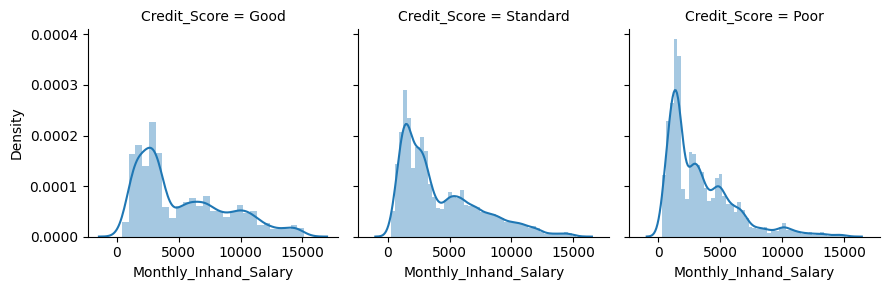

In [ ]:
grid = sns.FacetGrid(df, col = 'Credit_Score')
grid.map(sns.distplot, 'Monthly_Inhand_Salary')

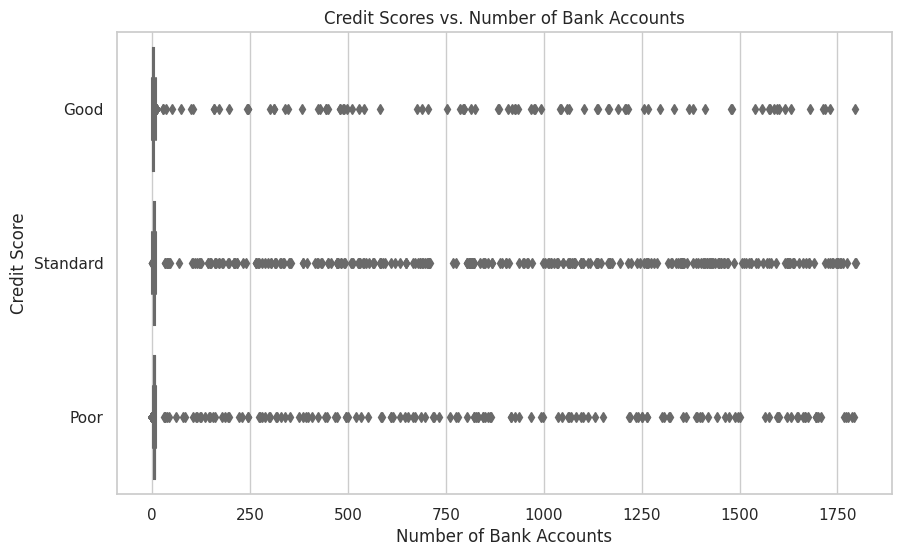

In [ ]:
sns.set(style="whitegrid")

plt.figure(figsize=(10, 6))
sns.boxplot(x='Num_Bank_Accounts', y='Credit_Score', data=df, palette="Set3")
plt.title('Credit Scores vs. Number of Bank Accounts')
plt.xlabel('Number of Bank Accounts')
plt.ylabel('Credit Score')
plt.show()

# Bussiness Insight

In [ ]:
result = df.groupby('Credit_Score')['Annual_Income'].agg(['min', 'max']).reset_index()

result.columns = ['Credit_Score', 'Lowest_Income', 'Highest_Income']

print(result)

  Credit_Score  Lowest_Income  Highest_Income
0         Good       7261.910      24198062.0
1         Poor       7006.035      23912939.0
2     Standard       7006.520      24177153.0


<Axes: xlabel='Occupation', ylabel='count'>

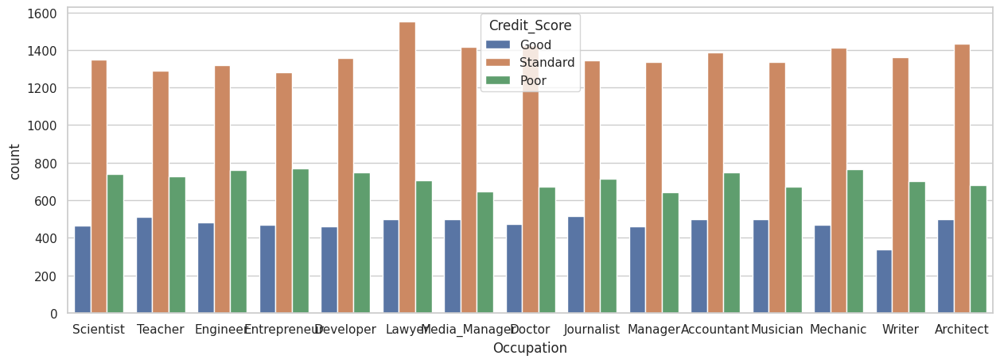

In [ ]:
plt.figure(figsize=(15,5))
sns.countplot(data=df, x='Occupation', hue='Credit_Score')

In [ ]:
df_showed = df.copy()

labels = ['18-27', '28-37', '38-47', '48-57']
df_showed['age_group'] = pd.cut(df_showed['Age'], bins=[18, 27, 37, 47, 57], labels=labels, right=False)
result = pd.crosstab(df_showed['age_group'], df_showed['Credit_Score'])

result.columns = ['Poor', 'Good', 'Standard']

result.reset_index(inplace=True)
result['Poor_percentage'] = (result['Poor'] / (result['Poor'] + result['Good'] + result['Standard'])) * 100

result = result.sort_values(by='Poor_percentage', ascending=False)

print(result)

  age_group  Poor  Good  Standard  Poor_percentage
3     48-57  1754   631      2951        32.871064
2     38-47  1931  3302      6085        17.061318
1     28-37  1977  3822      6399        16.207575
0     18-27  1488  2941      5159        15.519399


<Axes: xlabel='Age', ylabel='count'>

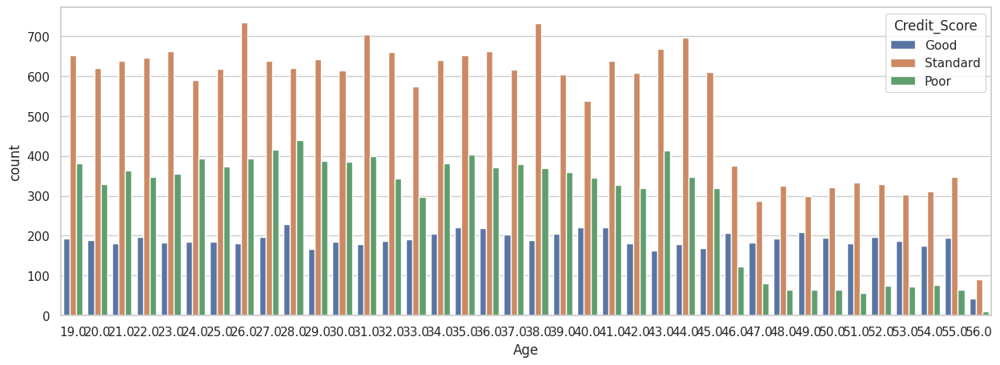

In [ ]:
plt.figure(figsize=(15,5))
sns.countplot(data=df, x='Age', hue='Credit_Score')

In [ ]:
result = pd.crosstab(df['Age'], df['Credit_Score'])

result.columns = ['Good', 'Poor', 'Standard']

result.reset_index(inplace=True)
result['Poor_percentage'] = (result['Poor'] / (result['Poor'] + result['Good'] + result['Standard'])) * 100

result = result.sort_values(by='Age')

print(result)

     Age  Good  Poor  Standard  Poor_percentage
0   19.0   192   382       651        31.183673
1   20.0   189   330       620        28.972783
2   21.0   180   364       638        30.795262
3   22.0   197   348       646        29.219144
4   23.0   182   356       662        29.666667
5   24.0   184   394       589        33.761782
6   25.0   184   374       618        31.802721
7   26.0   180   393       735        30.045872
8   27.0   197   415       637        33.226581
9   28.0   229   439       619        34.110334
10  29.0   166   387       641        32.412060
11  30.0   185   385       613        32.544379
12  31.0   178   400       705        31.176929
13  32.0   187   343       659        28.847771
14  33.0   191   297       574        27.966102
15  34.0   204   382       639        31.183673
16  35.0   222   403       651        31.583072
17  36.0   218   371       661        29.680000
18  37.0   202   379       616        31.662490
19  38.0   188   369       733        28

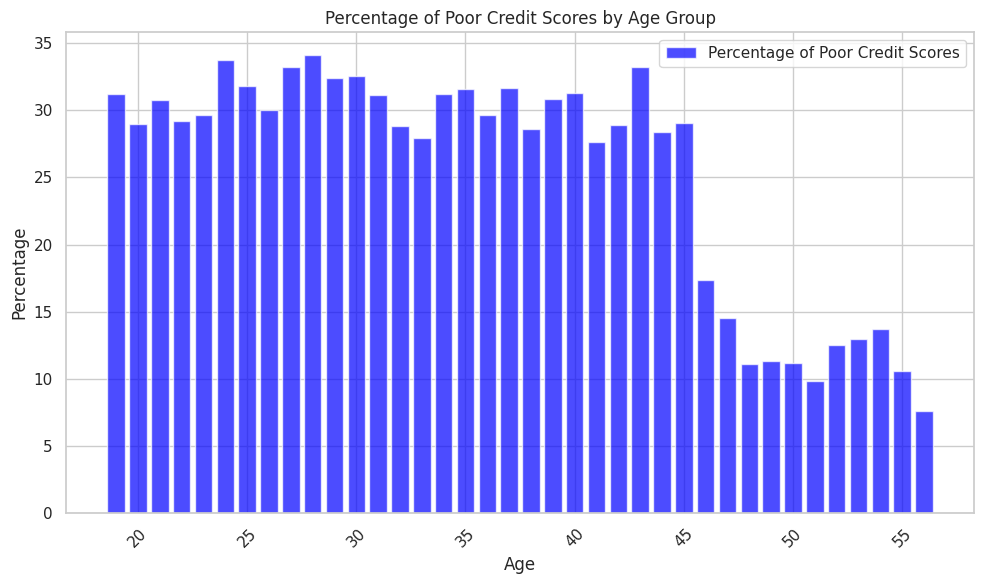

In [ ]:
age_credit_score_counts = df.groupby(['Age', 'Credit_Score']).size().unstack(fill_value=0)

age_credit_score_counts['total'] = age_credit_score_counts.sum(axis=1)

age_credit_score_counts['poor_percentage'] = (age_credit_score_counts['Poor'] / age_credit_score_counts['total']) * 100

age_groups = age_credit_score_counts.index
poor_percentages = age_credit_score_counts['poor_percentage']

plt.figure(figsize=(10, 6))
plt.bar(age_groups, poor_percentages, color='blue', alpha=0.7, label='Percentage of Poor Credit Scores')
plt.xlabel('Age')
plt.ylabel('Percentage')
plt.title('Percentage of Poor Credit Scores by Age Group')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [ ]:
df_showed = df.copy()

labels = ['18-27', '28-37', '38-47', '48-57']
df_showed['age_group'] = pd.cut(df_showed['Age'], bins=[18, 27, 37, 47, 57], labels=labels, right=False)
result = pd.crosstab(df_showed['age_group'], df_showed['Credit_Score'])

result.columns = ['Good', 'Poor', 'Standard']

result.reset_index(inplace=True)
result['Poor_percentage'] = (result['Poor'] / (result['Poor'] + result['Good'] + result['Standard'])) * 100

result = result.sort_values(by='Poor_percentage', ascending=False)

print(result)

  age_group  Good  Poor  Standard  Poor_percentage
1     28-37  1977  3822      6399        31.333005
0     18-27  1488  2941      5159        30.673759
2     38-47  1931  3302      6085        29.174766
3     48-57  1754   631      2951        11.825337


In [ ]:
result = pd.crosstab(df['Occupation'], df['Credit_Score'])

result.columns = ['Good', 'Poor', 'Standard']

result.reset_index(inplace=True)
result['Poor_percentage'] = (result['Poor'] / (result['Poor'] + result['Good'] + result['Standard'])) * 100

result = result.sort_values(by='Poor_percentage', ascending=False)

print(result)

       Occupation  Good  Poor  Standard  Poor_percentage
5    Entrepreneur   468   768      1280        30.524642
4        Engineer   483   760      1319        29.664325
14         Writer   339   703      1360        29.267277
2       Developer   463   749      1357        29.155313
9        Mechanic   468   767      1414        28.954322
12      Scientist   467   739      1350        28.912363
13        Teacher   513   729      1291        28.780103
0      Accountant   499   750      1385        28.473804
6      Journalist   514   714      1343        27.771295
11       Musician   501   672      1336        26.783579
8         Manager   460   641      1336        26.302831
3          Doctor   475   672      1423        26.147860
1       Architect   498   680      1433        26.043661
7          Lawyer   501   706      1550        25.607544
10  Media_Manager   501   646      1417        25.195008


In [ ]:
pivot_table = pd.pivot_table(df_showed,
                             index=['Occupation', 'age_group'],
                             columns='Credit_Score',
                             values='Age',
                             aggfunc='count',
                             fill_value=0,)

pivot_table['poor_percentage'] = (pivot_table['Poor'] / (pivot_table['Good'] + pivot_table['Standard'] + pivot_table['Poor'])) * 100

result = pivot_table.reset_index()
result = result.sort_values(by='poor_percentage', ascending=False)

print(result)

Credit_Score     Occupation age_group  Good  Poor  Standard  poor_percentage
9                 Developer     28-37   112   286       379        36.808237
36                 Mechanic     18-27    72   228       337        35.792779
45                 Musician     28-37   109   254       371        34.604905
20             Entrepreneur     18-27   102   213       301        34.577922
22             Entrepreneur     38-47   122   250       369        33.738192
0                Accountant     18-27    88   218       344        33.538462
49                Scientist     28-37   129   263       393        33.503185
38                 Mechanic     38-47   141   264       385        33.417722
57                   Writer     28-37   100   276       451        33.373640
17                 Engineer     28-37   148   286       428        33.178654
18                 Engineer     38-47   120   228       355        32.432432
21             Entrepreneur     28-37   135   262       415        32.266010

# Modelling

In [ ]:
from sklearn.model_selection import train_test_split, RandomizedSearchCV, cross_val_score
from sklearn.linear_model import LogisticRegression, PassiveAggressiveClassifier, SGDClassifier, RidgeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier, AdaBoostClassifier, GradientBoostingClassifier, VotingClassifier, HistGradientBoostingClassifier, BaggingClassifier
from xgboost import XGBClassifier, XGBRFClassifier
from lightgbm import LGBMClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB, BernoulliNB
from sklearn.neural_network import MLPClassifier
from scipy.stats import probplot
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer, SimpleImputer
from sklearn.feature_selection import SelectKBest, SelectPercentile, SelectFromModel, f_classif
from sklearn.preprocessing import StandardScaler, OrdinalEncoder, PowerTransformer, FunctionTransformer, OneHotEncoder, LabelEncoder
from sklearn.metrics import ConfusionMatrixDisplay, classification_report, precision_score, recall_score, accuracy_score, f1_score
from imblearn.over_sampling import SMOTE

## Outlier handling

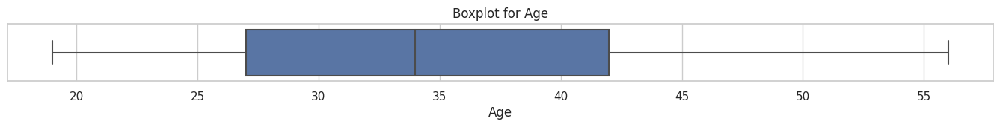

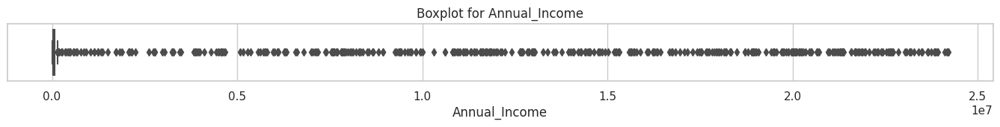

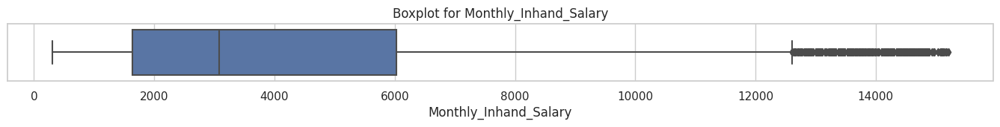

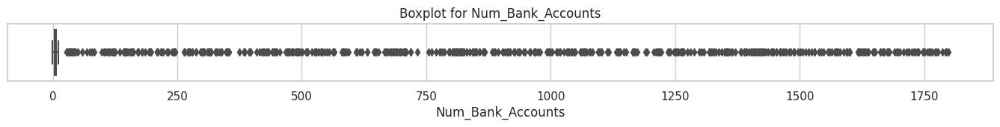

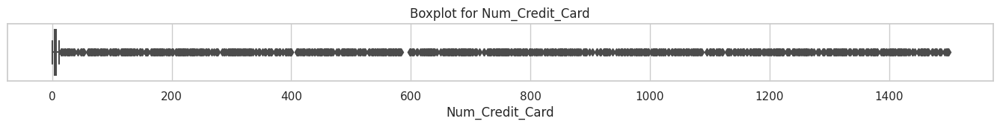

...

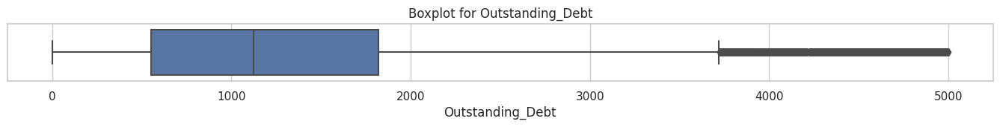

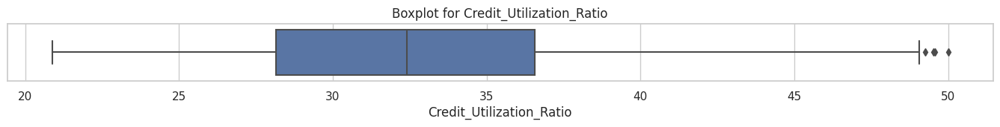

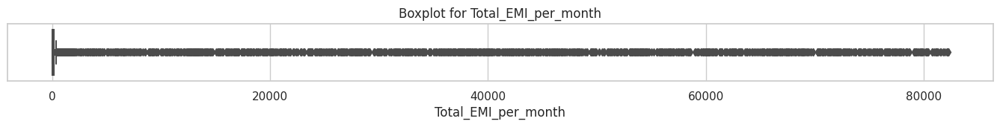

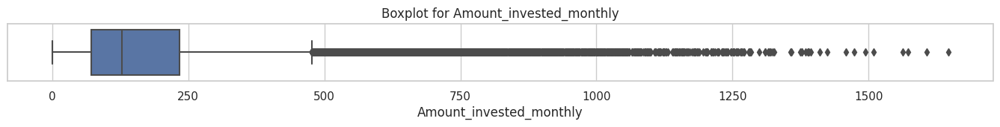

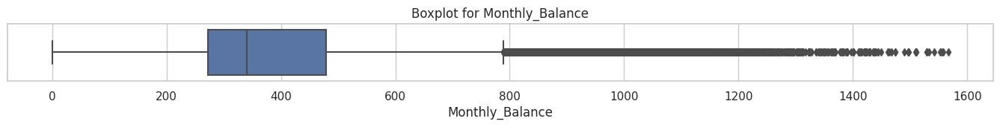

In [ ]:
for column in num_col:
    plt.figure(figsize=(17, 1))
    sns.boxplot(data=df, x=column)
    plt.title(f'Boxplot for {column}')
    plt.show()

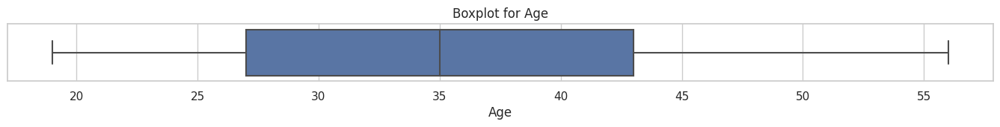

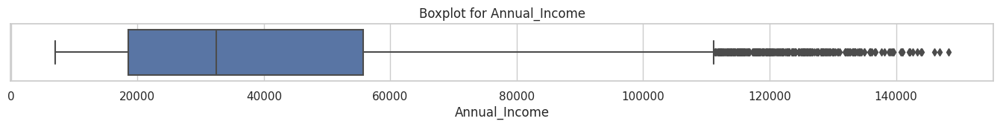

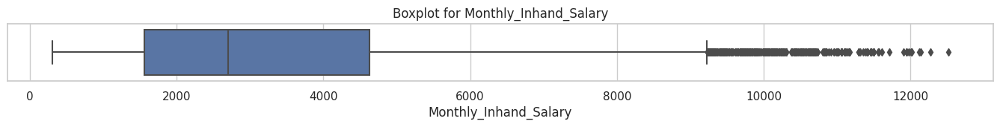

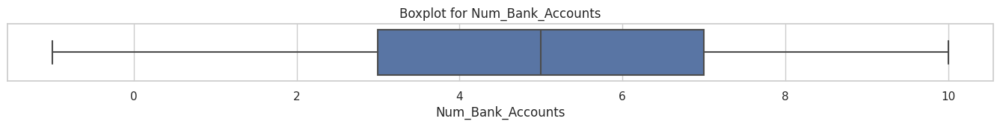

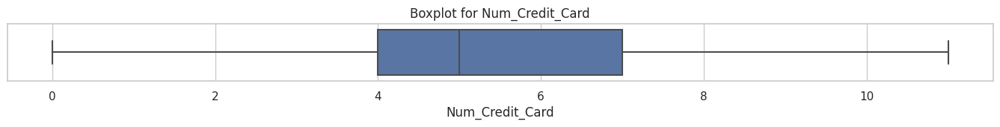

...

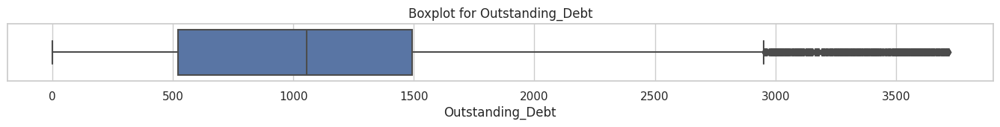

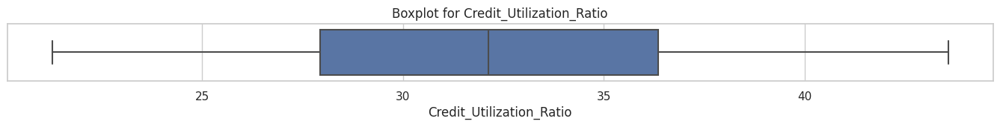

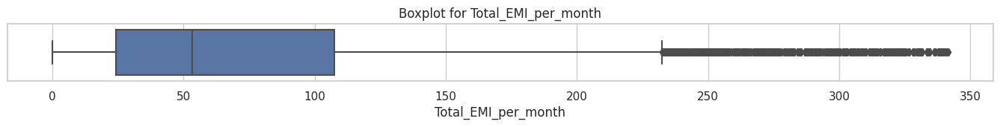

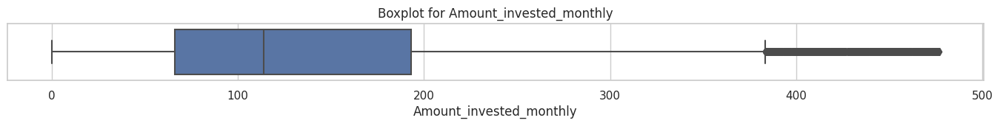

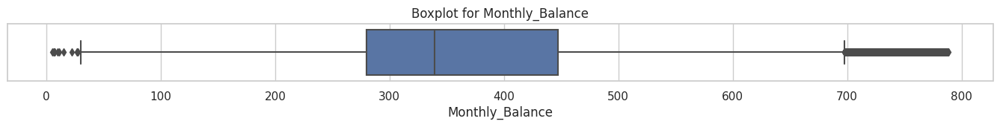

In [ ]:
Q1 = df[num_col].quantile(0.25)
Q3 = df[num_col].quantile(0.75)
IQR = Q3 - Q1

condition = ~((df[num_col] < (Q1 - 1.5 * IQR)) | (df[num_col] > (Q3 + 1.5 * IQR))).any(axis=1)
df_without_outliers = df[condition]

for column in num_col:
    plt.figure(figsize=(17, 1))
    sns.boxplot(data=df_without_outliers, x=column)
    plt.title(f'Boxplot for {column}')
    plt.show()

In [ ]:
df_without_outliers

,Month,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,...,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance,Credit_Score,spend behaviour,value payment behaviour
0,1.0,23.0,Scientist,19114.12,1824.843333,3,4,3,4.0,3,...,809.98,26.822620,265.0,No,49.574949,80.415295,312.494089,Good,High,Small
9,2.0,28.0,Teacher,34847.84,3037.986667,2,4,6,1.0,7,...,605.03,38.550848,320.0,No,18.816215,40.391238,484.591214,Good,High,Large
12,5.0,28.0,Teacher,34847.84,3037.986667,2,4,6,1.0,3,...,605.03,34.977895,323.0,No,18.816215,130.115420,444.867032,Good,Low,Small
13,6.0,28.0,Teacher,34847.84,3037.986667,2,4,6,1.0,3,...,605.03,33.381010,324.0,No,18.816215,43.477190,481.505262,Good,High,Large
15,8.0,28.0,Teacher,34847.84,3037.986667,2,4,6,1.0,3,...,605.03,32.933856,326.0,No,18.816215,218.904344,356.078109,Good,Low,Small
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99988,5.0,28.0,Architect,20002.88,1929.906667,10,8,29,5.0,33,...,3571.70,28.508250,72.0,Yes,60.964772,213.978010,208.047884,Standard,Low,Small
99991,8.0,29.0,Architect,20002.88,1929.906667,10,8,29,5.0,33,...,3571.70,37.140784,75.0,Yes,60.964772,34.662906,337.362988,Standard,High,Large
99994,3.0,25.0,Mechanic,39628.99,3359.415833,4,6,7,2.0,20,...,502.38,39.323569,377.0,No,35.104023,140.581403,410.256158,Poor,High,Medium
99995,4.0,25.0,Mechanic,39628.99,3359.415833,4,6,7,2.0,23,...,502.38,34.663572,378.0,No,35.104023,60.971333,479.866228,Poor,High,Large


## Encode

In [ ]:
df_num = pd.get_dummies(df_without_outliers, columns = ['Occupation', 'Payment_of_Min_Amount'])
df_num['spend behaviour'] = preprocessing.LabelEncoder().fit_transform(df_without_outliers['spend behaviour'])
df_num['value payment behaviour'] = preprocessing.LabelEncoder().fit_transform(df_without_outliers['value payment behaviour'])
df_num['Credit_Mix'] = preprocessing.LabelEncoder().fit_transform(df_without_outliers['Credit_Mix'])
df_num['Credit_Score'] = df_without_outliers['Credit_Score'].replace("Poor", 0).replace("Standard", 1).replace("Good", 2)

## Handling Multicol

In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

X = df_num.drop('Credit_Score', axis=1)
y = df_num['Credit_Score']

vif = pd.DataFrame()
vif["Features"] = X.columns
vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

print(vif)

                     Features         VIF
0                       Month    1.060761
1                         Age    1.058598
2               Annual_Income  160.648991
3       Monthly_Inhand_Salary  257.694279
4           Num_Bank_Accounts    1.813999
5             Num_Credit_Card    1.387361
6               Interest_Rate    2.254673
7                 Num_of_Loan    3.672269
8         Delay_from_due_date    1.713124
9      Num_of_Delayed_Payment    1.730363
10       Changed_Credit_Limit    1.355925
11       Num_Credit_Inquiries    2.253566
12                 Credit_Mix    1.169314
13           Outstanding_Debt    2.134529
14   Credit_Utilization_Ratio    1.023572
15         Credit_History_Age    1.909224
16        Total_EMI_per_month    9.950593
17    Amount_invested_monthly   30.136033
18            Monthly_Balance   51.678563
19            spend behaviour    2.408917
20    value payment behaviour    1.420456
21      Occupation_Accountant         inf
22       Occupation_Architect     

In [ ]:
df_model = df_num.drop(['Annual_Income', 'Monthly_Inhand_Salary',],axis=1)

In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

X = df_model.drop('Credit_Score', axis=1)
y = df_model['Credit_Score']

vif = pd.DataFrame()
vif["Features"] = X.columns
vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

print(vif)

                     Features       VIF
0                       Month  1.054700
1                         Age  1.058154
2           Num_Bank_Accounts  1.813762
3             Num_Credit_Card  1.386558
4               Interest_Rate  2.252902
5                 Num_of_Loan  3.188414
6         Delay_from_due_date  1.712997
7      Num_of_Delayed_Payment  1.729957
8        Changed_Credit_Limit  1.355758
9        Num_Credit_Inquiries  2.253448
10                 Credit_Mix  1.169076
11           Outstanding_Debt  2.133123
12   Credit_Utilization_Ratio  1.023539
13         Credit_History_Age  1.908556
14        Total_EMI_per_month  2.516565
15    Amount_invested_monthly  1.633815
16            Monthly_Balance  2.033989
17            spend behaviour  1.620846
18    value payment behaviour  1.209258
19      Occupation_Accountant       inf
20       Occupation_Architect       inf
21       Occupation_Developer       inf
22          Occupation_Doctor       inf
23        Occupation_Engineer       inf


## Start Modelling

Tuning XGBoost: 100%|██████████| 10/10 [01:53<00:00, 11.40s/it]


                 Model  Train Precision  Train Accuracy  Train Recall  \
0  Logistic Regression         0.663031        0.663031      0.663031   
1        Decision Tree         0.775678        0.775678      0.775678   
2        Random Forest         1.000000        1.000000      1.000000   
3              XGBoost         0.953667        0.953667      0.953667   

   Train F1 Score  Test Precision  Test Accuracy  Test Recall  Test F1 Score  
0        0.663031        0.670410       0.670410     0.670410       0.670410  
1        0.775678        0.717279       0.717279     0.717279       0.717279  
2        1.000000        0.781425       0.781425     0.781425       0.781425  
3        0.953667        0.767171       0.767171     0.767171       0.767171  


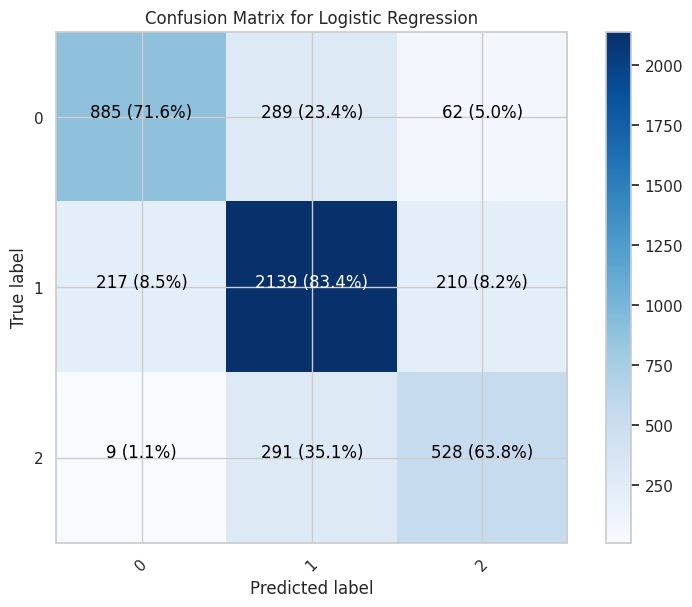

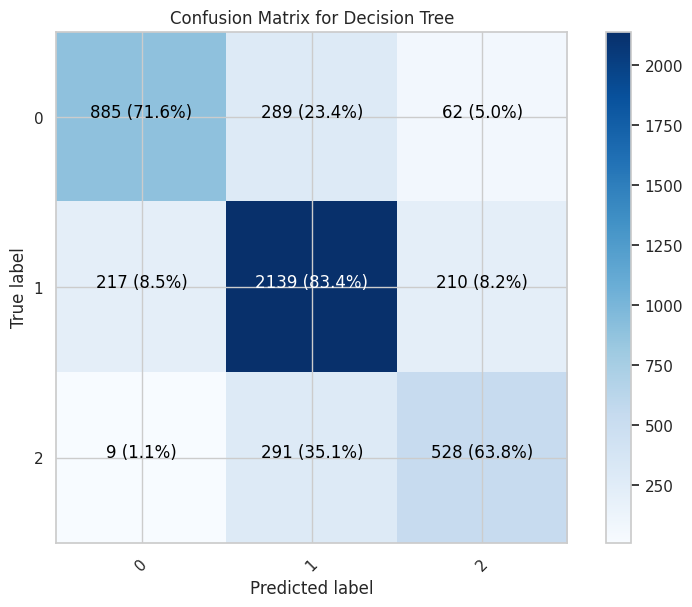

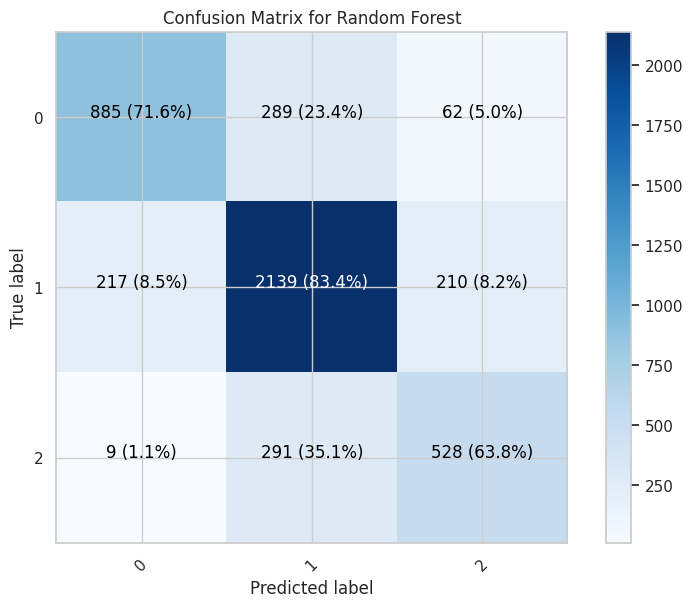

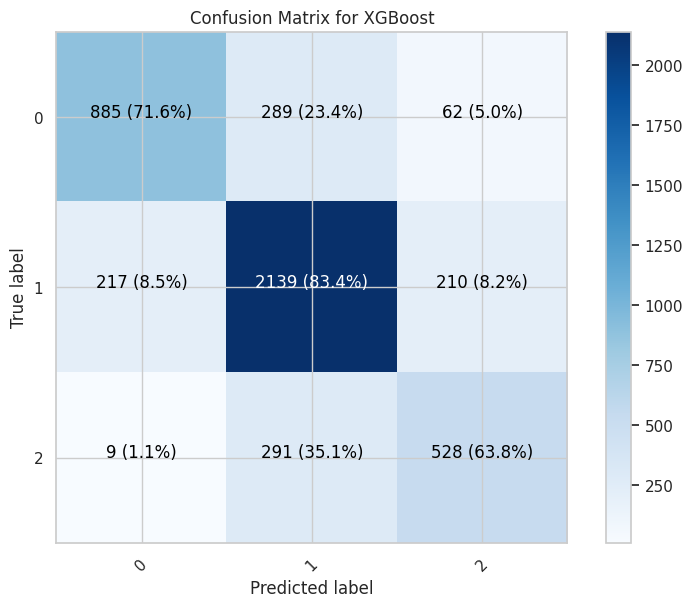

In [ ]:
import numpy as np
import pandas as pd
import xgboost as xgb
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import precision_score, accuracy_score, recall_score, f1_score, confusion_matrix
from tqdm import tqdm
import itertools

data = df_model

X = data.drop('Credit_Score', axis=1)
y = data['Credit_Score']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

models = {
    "Logistic Regression": LogisticRegression(),
    "Decision Tree": DecisionTreeClassifier(),
    "Random Forest": RandomForestClassifier(),
    "XGBoost": xgb.XGBClassifier()
}

param_grids = {
    "Logistic Regression": {
        "C": np.logspace(-4, 4, 20),
        "penalty": ["l1", "l2"]
    },
    "Decision Tree": {
        "max_depth": [None, 10, 20, 30],
        "min_samples_split": [2, 5, 10],
        "min_samples_leaf": [1, 2, 4]
    },
    "Random Forest": {
        "n_estimators": [100, 200, 300],
        "max_depth": [None, 10, 20, 30],
        "min_samples_split": [2, 5, 10],
        "min_samples_leaf": [1, 2, 4]
    },
    "XGBoost": {
        "n_estimators": [100, 200, 300],
        "learning_rate": [0.01, 0.1, 0.2],
        "max_depth": [3, 4, 5, 6],
        "min_child_weight": [1, 2, 3],
        "subsample": [0.8, 0.9, 1.0],
        "colsample_bytree": [0.8, 0.9, 1.0]
    }
}

results = []

for model_name, model in models.items():
    param_grid = param_grids[model_name]
    random_search = RandomizedSearchCV(model, param_grid, n_iter=10, scoring='f1_micro', cv=5, n_jobs=-1, random_state=42)

    with tqdm(total=10, desc=f"Tuning {model_name}") as pbar:
        random_search.fit(X_train, y_train)
        pbar.update(10)

    best_model = random_search.best_estimator_

    train_pred = best_model.predict(X_train)
    test_pred = best_model.predict(X_test)

    train_precision = precision_score(y_train, train_pred, average='micro')
    train_accuracy = accuracy_score(y_train, train_pred)
    train_recall = recall_score(y_train, train_pred, average='micro')
    train_f1 = f1_score(y_train, train_pred, average='micro')

    test_precision = precision_score(y_test, test_pred, average='micro')
    test_accuracy = accuracy_score(y_test, test_pred)
    test_recall = recall_score(y_test, test_pred, average='micro')
    test_f1 = f1_score(y_test, test_pred, average='micro')

    results.append([model_name,
                    train_precision, train_accuracy, train_recall, train_f1,
                    test_precision, test_accuracy, test_recall, test_f1])

columns = ["Model",
           "Train Precision", "Train Accuracy", "Train Recall", "Train F1 Score",
           "Test Precision", "Test Accuracy", "Test Recall", "Test F1 Score"]
df = pd.DataFrame(results, columns=columns)

print(df)

for result in results:
    model_name = result[0]
    test_precision = result[5]
    test_recall = result[7]
    test_f1 = result[8]
    test_cm = confusion_matrix(y_test, best_model.predict(X_test))

    plt.figure(figsize=(8, 6))
    plt.imshow(test_cm, interpolation='nearest', cmap=plt.cm.Blues)
    plt.title(f'Confusion Matrix for {model_name}')
    plt.colorbar()

    # Create tick marks
    tick_marks = np.arange(len(np.unique(y)))
    plt.xticks(tick_marks, np.unique(y), rotation=45)
    plt.yticks(tick_marks, np.unique(y))

    # Display the matrix values on the plot as percentages
    cm_percentage = test_cm.astype('float') / test_cm.sum(axis=1)[:, np.newaxis] * 100
    for i, j in itertools.product(range(test_cm.shape[0]), range(test_cm.shape[1])):
        plt.text(j, i, f'{test_cm[i, j]} ({cm_percentage[i, j]:.1f}%)',
                 horizontalalignment='center', color='white' if test_cm[i, j] > test_cm.max() / 2 else 'black')

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()
